# Exam Question: Part A Landslide Iran Data

Using the (Landslide_Factors_IRAN.csv) dataset from Kaggle to generate various insights on landslide occurrences in Iran.
Generate and publish your results in a python notebook on your Kaggle or Github account.

## Importation of Important Libraries

In [1]:
# Data Manipulation and Analysis Libraries
import pandas as pd
import numpy as np

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

# Ignore Warnings (Optional)
import warnings
warnings.filterwarnings('ignore')

## Milestone One: Data Wrangling

### Loading the 'Landslide_Factors_IRAN.csv' dataset

In [2]:
file_path = 'Landslide_Factors_IRAN.csv'

df = pd.read_csv(file_path)

# Displaying the first few rows of the DataFrame
df.head()

,ID,LONG,LAT,SUB_Basin,Elevation,AAP(mm),RiverDIST(m),FaultDIST(m),Landuse_Type,Slop(Percent),Slop(Degrees),GEO_UNIT,DES_GEOUNI,Climate_Type,DES_ClimateType
0,1,52.326,27.763,Mehran,617.0,137,1448.705292,40639.57890,poorrange,42.240669,22.899523,EOas-ja,"Undivided Asmari and Jahrum Formation , regard...",A-M-VW,"Warm and humid, with a humid period longer tha..."
1,2,52.333,27.772,Mehran,944.0,137,344.299484,40135.02913,mix(woodland_x),68.219116,34.301464,KEpd-gu,Keewatin Epedotic quartz diorite,A-M-VW,"Warm and humid, with a humid period longer tha..."
2,3,52.326,27.763,Mehran,617.0,137,1448.705292,40639.57890,poorrange,42.240669,22.899523,EOas-ja,"Undivided Asmari and Jahrum Formation , regard...",A-M-VW,"Warm and humid, with a humid period longer tha..."
3,4,52.333,27.694,Mehran,55.0,137,1889.828623,42189.54442,rock,12.141766,6.922833,Mlmmi,Low weathering grey marls alternating with ba...,A-M-VW,"Warm and humid, with a humid period longer tha..."
4,5,52.324,27.682,Mehran,20.0,137,874.201691,43010.08400,poorrange,2.216230,1.269598,MuPlaj,"Brown to grey , calcareous , feature - formin...",A-M-VW,"Warm and humid, with a humid period longer tha..."


### Exploring the 'Landslide_Factors_IRAN.csv' dataset
In this subsection we check the dimensions of the dataset i.e the number of rows and columns, explore the basic statistics of numerical features i.e mean, median, standard deviation and as well gain an understanding of the distribution of the target variable 'Value'.

In [3]:
# Overview of the 'Landslide_Factors_IRAN.csv' dataset shape and composition at a high level
df.shape

(4295, 15)

In [4]:
# Identifying dataset variables
df.columns.values

array(['ID', 'LONG', 'LAT', 'SUB_Basin', 'Elevation', 'AAP(mm)',
       'RiverDIST(m)', 'FaultDIST(m)', 'Landuse_Type', 'Slop(Percent)',
       'Slop(Degrees)', 'GEO_UNIT', 'DES_GEOUNI', 'Climate_Type',
       'DES_ClimateType'], dtype=object)

In [5]:
# Getting general information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4295 entries, 0 to 4294
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               4295 non-null   int64  
 1   LONG             4295 non-null   float64
 2   LAT              4295 non-null   float64
 3   SUB_Basin        4295 non-null   object 
 4   Elevation        4295 non-null   float64
 5   AAP(mm)          4295 non-null   int64  
 6   RiverDIST(m)     4295 non-null   float64
 7   FaultDIST(m)     4295 non-null   float64
 8   Landuse_Type     4295 non-null   object 
 9   Slop(Percent)    4295 non-null   float64
 10  Slop(Degrees)    4295 non-null   float64
 11  GEO_UNIT         4295 non-null   object 
 12  DES_GEOUNI       4295 non-null   object 
 13  Climate_Type     4295 non-null   object 
 14  DES_ClimateType  4295 non-null   object 
dtypes: float64(7), int64(2), object(6)
memory usage: 503.4+ KB


In [6]:
# Summary Statistics of the Landslide_Factors DataFrame
df.describe(include = 'all')

,ID,LONG,LAT,SUB_Basin,Elevation,AAP(mm),RiverDIST(m),FaultDIST(m),Landuse_Type,Slop(Percent),Slop(Degrees),GEO_UNIT,DES_GEOUNI,Climate_Type,DES_ClimateType
count,4295.000000,4295.000000,4295.000000,4295,4295.000000,4295.000000,4295.000000,4295.000000,4295,4295.000000,4295.000000,4295,4295,4295,4295
unique,NaN,NaN,NaN,65,NaN,NaN,NaN,NaN,37,NaN,NaN,217,204,15,5
top,NaN,NaN,NaN,Karun,NaN,NaN,NaN,NaN,modrange,NaN,NaN,Qft2,Low level piedmont fan and valley teraces dep...,SA-K-W,"Hot and dry, with a dry period longer than the..."
freq,NaN,NaN,NaN,593,NaN,NaN,NaN,NaN,602,NaN,NaN,331,331,1492,3622
mean,2148.000000,50.991609,34.934854,NaN,1391.111692,242.166007,809.247705,5464.176909,NaN,23.083628,12.684708,NaN,NaN,NaN,NaN
std,1240.004032,3.354156,2.639496,NaN,673.859458,136.964710,974.939030,5920.570823,NaN,15.483778,7.976655,NaN,NaN,NaN,NaN
min,1.000000,44.302000,26.424000,NaN,0.000000,54.000000,0.065920,1.121601,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN
25%,1074.500000,48.433000,32.997500,NaN,860.500000,158.000000,208.199375,1314.589467,NaN,11.533882,6.579355,NaN,NaN,NaN,NaN
50%,2148.000000,50.499000,36.173000,NaN,1552.000000,194.000000,526.187336,3486.626632,NaN,20.419369,11.540784,NaN,NaN,NaN,NaN
75%,3221.500000,53.190500,36.864000,NaN,1902.500000,270.000000,1116.083961,7701.447471,NaN,31.399784,17.432177,NaN,NaN,NaN,NaN


#### Heatmap of the Correlation Matrix of the Landslide_Factors DataFrame

                     ID      LONG       LAT  Elevation   AAP(mm)  \
ID             1.000000  0.198178  0.912163  -0.338261  0.382084   
LONG           0.198178  1.000000 -0.080544  -0.157758 -0.376029   
LAT            0.912163 -0.080544  1.000000  -0.256358  0.459409   
Elevation     -0.338261 -0.157758 -0.256358   1.000000 -0.138817   
AAP(mm)        0.382084 -0.376029  0.459409  -0.138817  1.000000   
RiverDIST(m)   0.006616  0.043270 -0.018935   0.068496 -0.013632   
FaultDIST(m)  -0.171383 -0.074611 -0.184588   0.029476 -0.010718   
Slop(Percent) -0.044250  0.027553 -0.061749   0.100840  0.009820   
Slop(Degrees) -0.041311  0.026953 -0.057491   0.104263  0.011663   

               RiverDIST(m)  FaultDIST(m)  Slop(Percent)  Slop(Degrees)  
ID                 0.006616     -0.171383      -0.044250      -0.041311  
LONG               0.043270     -0.074611       0.027553       0.026953  
LAT               -0.018935     -0.184588      -0.061749      -0.057491  
Elevation          0.06

<AxesSubplot:>

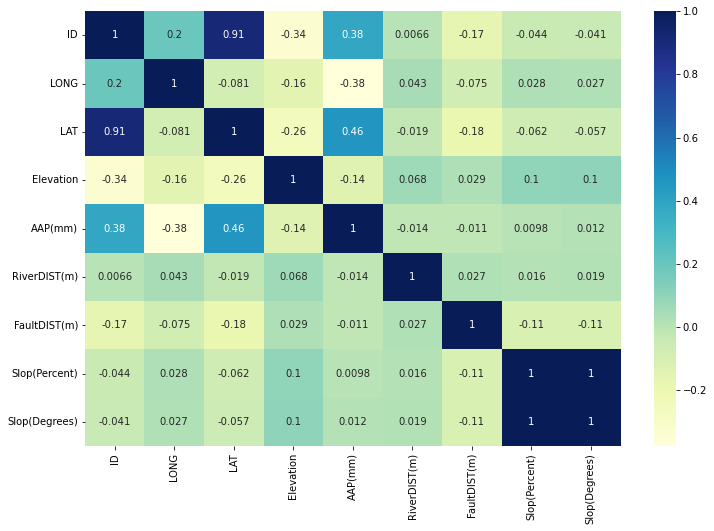

In [7]:
# Computing the correlation matrix
corr_matrix = df.corr()

# Printing the correlation matrix
print(corr_matrix)

# Creating a heatmap of the correlation matrix
plt.figure(figsize = (12, 8))
sns.heatmap(corr_matrix, annot = True, cmap = "YlGnBu")

### Pre-processing the Landslide_Factors DataFrame
This section focuses on the essential step of pre-processing the Landslide_Factors DataFrame, as it is a critical phase in data analysis, involving the cleaning and transformation of raw data to enhance its quality, reliability, and suitability for subsequent analyses or modeling.

In [8]:
# Checking for Missing Values in the Landslide_Factors DataFrame
df.isnull().sum()

ID                 0
LONG               0
LAT                0
SUB_Basin          0
Elevation          0
AAP(mm)            0
RiverDIST(m)       0
FaultDIST(m)       0
Landuse_Type       0
Slop(Percent)      0
Slop(Degrees)      0
GEO_UNIT           0
DES_GEOUNI         0
Climate_Type       0
DES_ClimateType    0
dtype: int64

From the results above its crucial to note that our Landslide_Factors dataframe has no missing values, thus, we can proceed with the exploratory data analysis

## Milestone Two: Data Exploration and Analysis of the Landslide_Factors DataFrame
In this section, we delve into the comprehensive exploration and analysis of the Landslide_Factors DataFrame. The exploration process involves a series of visualizations and statistical techniques aimed at gaining insights into the structure, patterns, and trends present in the data.

# 1. Univariate Analysis

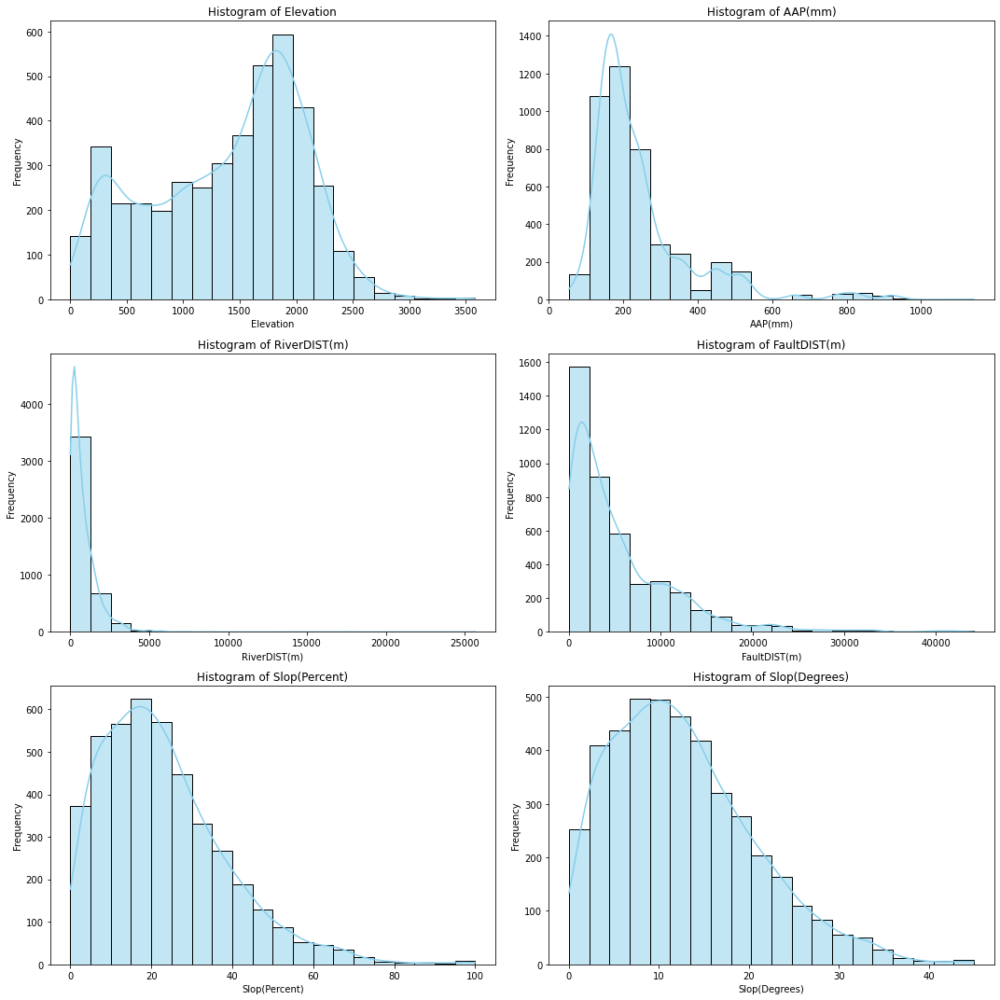

In [9]:
# Univariate analysis of numerical variables
numerical_vars = ["Elevation", "AAP(mm)", "RiverDIST(m)", "FaultDIST(m)", "Slop(Percent)", "Slop(Degrees)"]

# Create subplots for each numerical variable
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()

for i, var in enumerate(numerical_vars):
    sns.histplot(df[var], ax=axes[i], kde=True, bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histogram of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

Analysis of the distribution of numerical variables "Elevation", "AAP(mm)", "RiverDIST(m)", "FaultDIST(m)", "Slop(Percent)" and "Slop(Degrees)" using histogram plots to understand their range and variability.

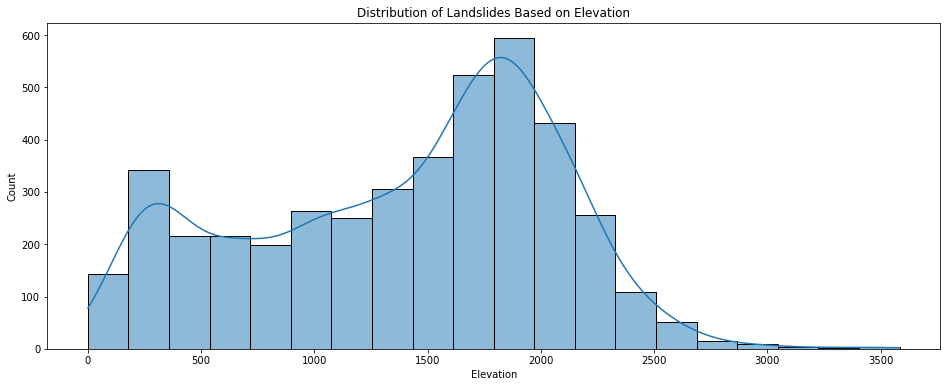

In [10]:
# Distribution of Landslides Based on Elevation
plt.figure(figsize=(16, 6))
sns.histplot(df['Elevation'], bins=20, kde=True)
plt.title('Distribution of Landslides Based on Elevation')
plt.xlabel('Elevation')
plt.ylabel('Count')
plt.show()

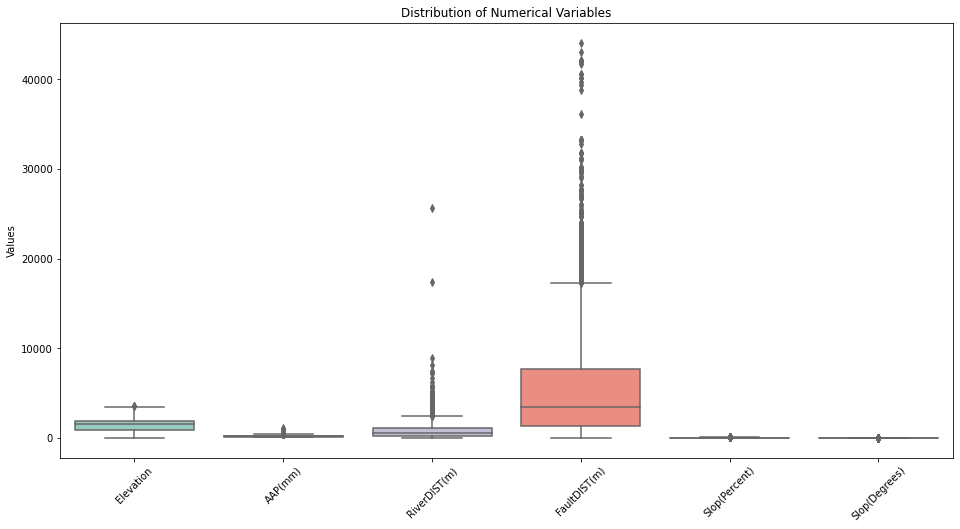

In [11]:
# Select numerical variables
numerical_vars = ["Elevation", "AAP(mm)", "RiverDIST(m)", "FaultDIST(m)", "Slop(Percent)", "Slop(Degrees)"]

# Create box plots for each numerical variable
plt.figure(figsize=(16, 8))
sns.boxplot(data=df[numerical_vars], orient='v', palette='Set3')
plt.title('Distribution of Numerical Variables')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.show()

Analysis of the distribution of numerical variables "Elevation", "AAP(mm)", "RiverDIST(m)", "FaultDIST(m)", "Slop(Percent)" and "Slop(Degrees)" using box plots to understand their range and variability.

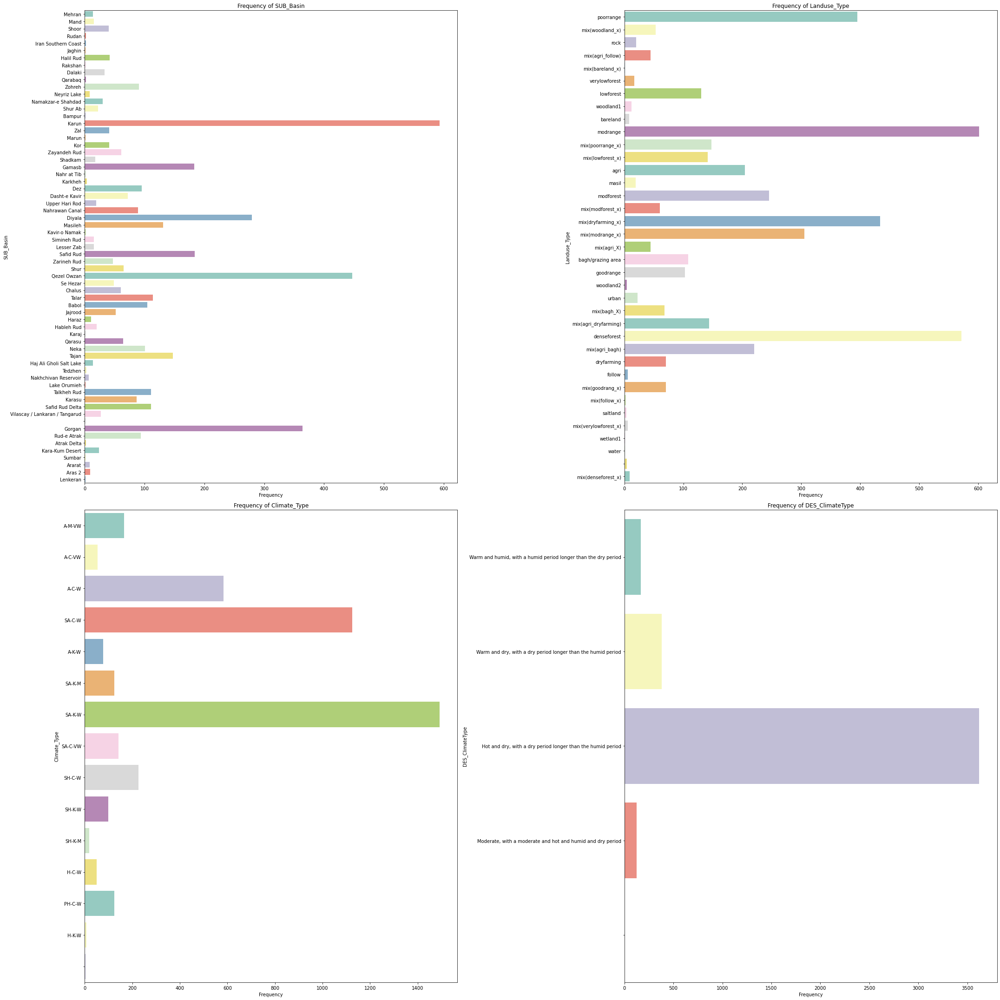

In [12]:
# Univariate analysis of categorical variables

# Select categorical variables
categorical_vars = ["SUB_Basin", "Landuse_Type", "Climate_Type", "DES_ClimateType"]

# Create subplots for each categorical variable
fig, axes = plt.subplots(2, 2, figsize=(30, 30))
axes = axes.flatten()

for i, var in enumerate(categorical_vars):
    sns.countplot(y=var, data=df, ax=axes[i], palette='Set3')
    axes[i].set_title(f'Frequency of {var}')
    axes[i].set_xlabel('Frequency')
    axes[i].set_ylabel(var)

# Adjust layout
plt.tight_layout()
plt.show()

The above visual displays bar charts for each categorical variable, showing the frequency of each category. Note that categorical variable "GEO_UNIT" and "DES_GEOUNI" were ignored for clear visuals.

# 2. Bivariate Analysis

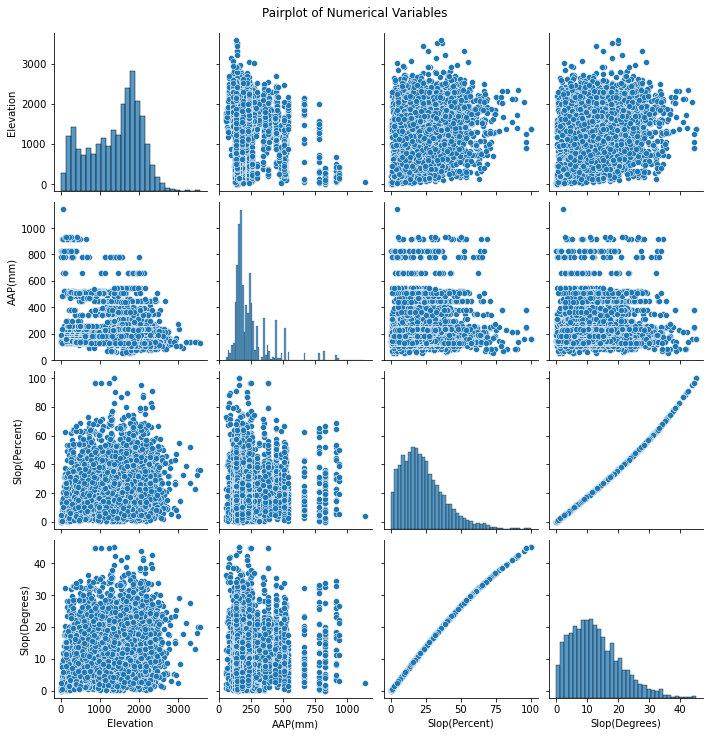

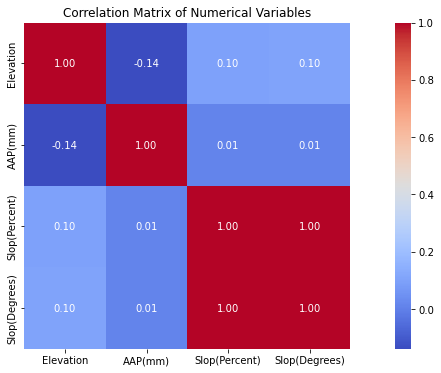

In [13]:
# Bivariate Analysis of Numerical Vs Numerical Variables

# Numerical variables for analysis
numerical_vars = ["Elevation", "AAP(mm)", "Slop(Percent)", "Slop(Degrees)"]

# Create pairplot for numerical variables
sns.pairplot(df[numerical_vars])
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()

# Calculate and display correlation matrix
correlation_matrix = df[numerical_vars].corr()
plt.figure(figsize=(16, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

The visual above is a pairplot showing scatter plots for each pair of numerical variables such as "Elevation" vs. "AAP(mm)" or "Slop(Percent)" vs. "Slop(Degrees) and a correlation matrix to quantify the relationships between them. 

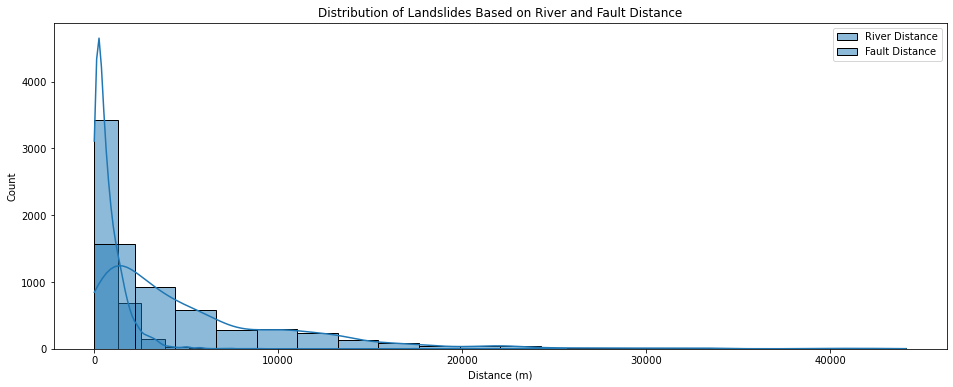

In [14]:
# Distribution of Landslides Based on River and Fault Distance
plt.figure(figsize=(16, 6))
sns.histplot(df['RiverDIST(m)'], bins=20, kde=True, label='River Distance')
sns.histplot(df['FaultDIST(m)'], bins=20, kde=True, label='Fault Distance')
plt.title('Distribution of Landslides Based on River and Fault Distance')
plt.xlabel('Distance (m)')
plt.ylabel('Count')
plt.legend()
plt.show()

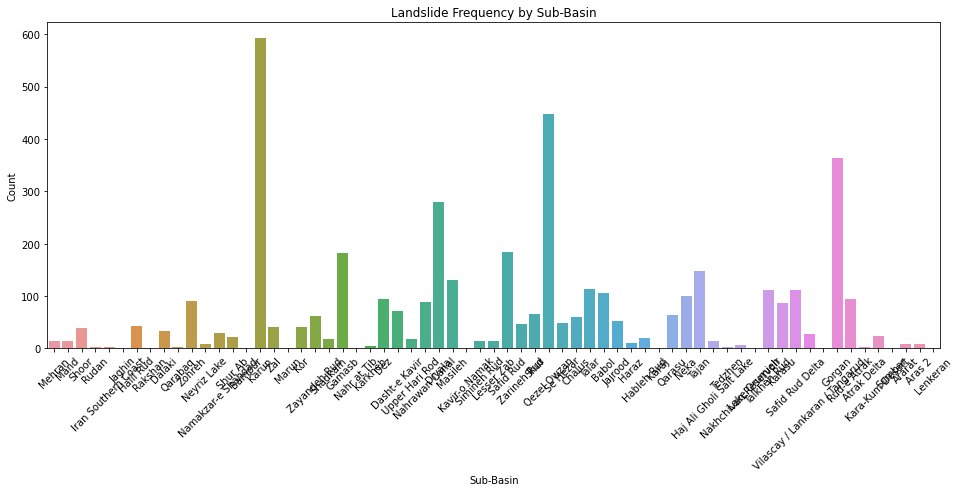

In [15]:
# Distribution of Landslide Frequency by Sub-Basin
plt.figure(figsize=(16, 6))
sns.countplot(x='SUB_Basin', data=df)
plt.title('Landslide Frequency by Sub-Basin')
plt.xlabel('Sub-Basin')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

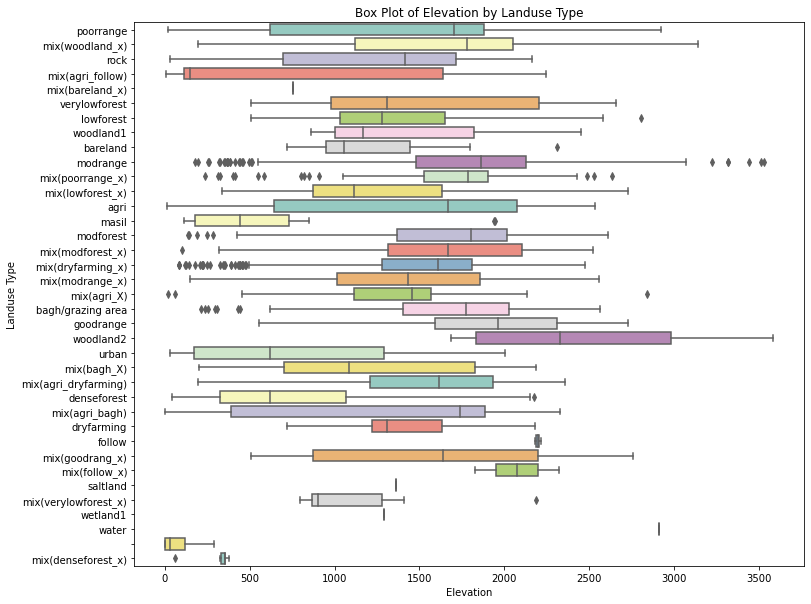

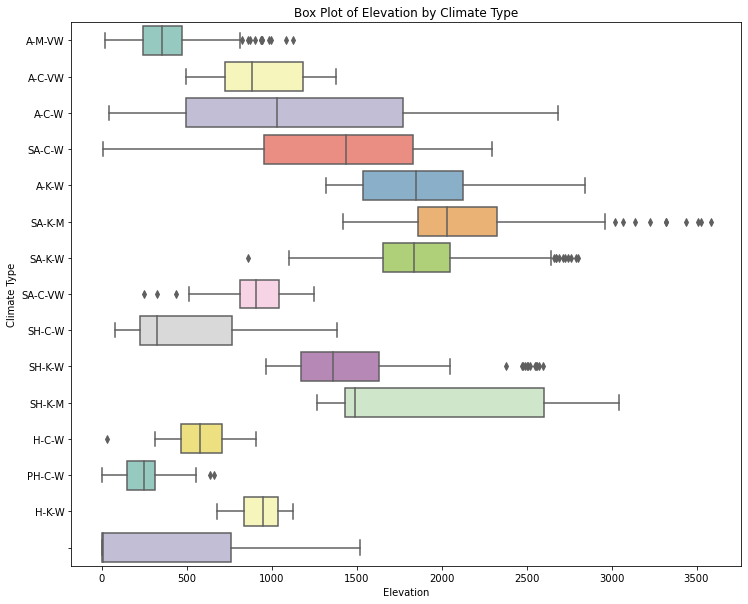

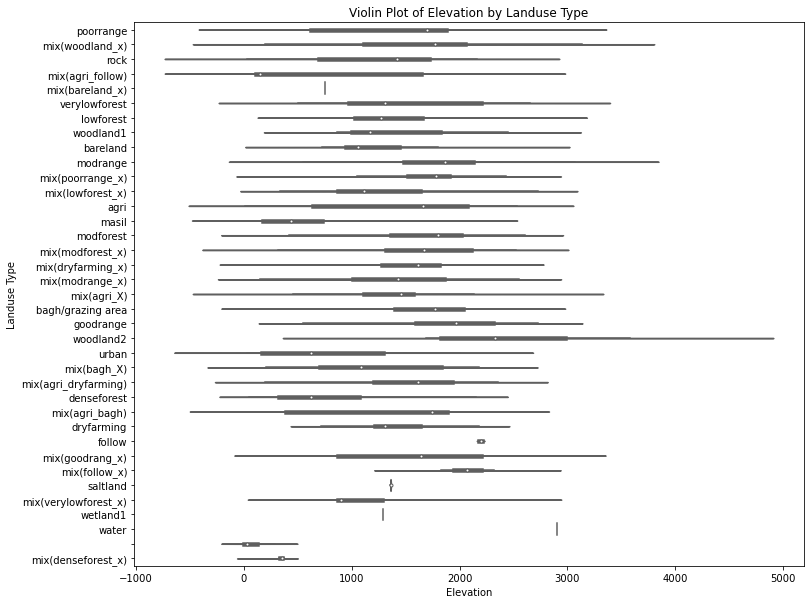

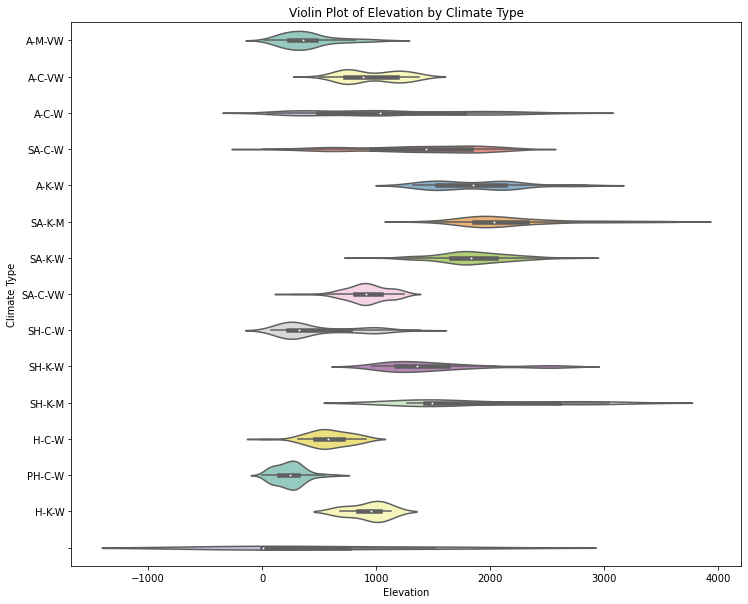

In [16]:
# Bivariate Analysis of Categorical Vs Numerical

# Selected categorical and numerical variables for analysis
categorical_vars_selected = ["Landuse_Type", "Climate_Type"]
numerical_var_selected = "Elevation"

# Create box plots for categorical vs. numerical variables
plt.figure(figsize=(12, 10))
sns.boxplot(x=numerical_var_selected, y="Landuse_Type", data=df, palette='Set3')
plt.title('Box Plot of Elevation by Landuse Type')
plt.xlabel('Elevation')
plt.ylabel('Landuse Type')
plt.show()

plt.figure(figsize=(12, 10))
sns.boxplot(x=numerical_var_selected, y="Climate_Type", data=df, palette='Set3')
plt.title('Box Plot of Elevation by Climate Type')
plt.xlabel('Elevation')
plt.ylabel('Climate Type')
plt.show()

# Create violin plots for categorical vs. numerical variables
plt.figure(figsize=(12, 10))
sns.violinplot(x=numerical_var_selected, y="Landuse_Type", data=df, palette='Set3')
plt.title('Violin Plot of Elevation by Landuse Type')
plt.xlabel('Elevation')
plt.ylabel('Landuse Type')
plt.show()

plt.figure(figsize=(12, 10))
sns.violinplot(x=numerical_var_selected, y="Climate_Type", data=df, palette='Set3')
plt.title('Violin Plot of Elevation by Climate Type')
plt.xlabel('Elevation')
plt.ylabel('Climate Type')
plt.show()

Box plots and violin plots showing the distribution of of numerical variables across different categories, like the "Elevation" variable across different categories of "Landuse_Type" and "Climate_Type." 

Chi-square test for SUB_Basin vs. Landuse_Type:
Chi-square statistic = 18773.502195250447, p-value = 0.0

Chi-square test for SUB_Basin vs. GEO_UNIT:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for SUB_Basin vs. Climate_Type:
Chi-square statistic = 17386.394234331696, p-value = 0.0

Chi-square test for Landuse_Type vs. SUB_Basin:
Chi-square statistic = 18773.50219525045, p-value = 0.0

Chi-square test for Landuse_Type vs. GEO_UNIT:
Chi-square statistic = 28805.30074181036, p-value = 0.0

Chi-square test for Landuse_Type vs. Climate_Type:
Chi-square statistic = 5980.754369044867, p-value = 0.0

Chi-square test for GEO_UNIT vs. SUB_Basin:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for GEO_UNIT vs. Landuse_Type:
Chi-square statistic = 28805.300741810355, p-value = 0.0

Chi-square test for GEO_UNIT vs. Climate_Type:
Chi-square statistic = 17107.27376152548, p-value = 0.0

Chi-square test for Climate_Type vs. SUB_Basin:
Chi-square s

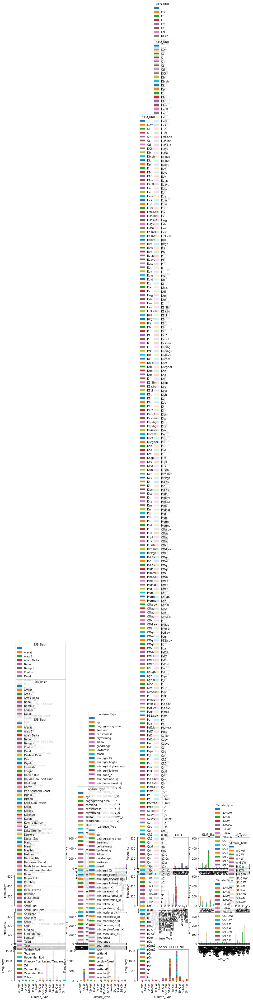

In [17]:
# Bivariate Analysis of Categorical Vs Categorical Variables
from scipy.stats import chi2_contingency

# Select categorical variables for analysis
categorical_vars = ["SUB_Basin", "Landuse_Type", "GEO_UNIT", "Climate_Type"]

# Create stacked bar charts for categorical vs. categorical variables
plt.figure(figsize=(16, 10))
for i, var1 in enumerate(categorical_vars):
    for j, var2 in enumerate(categorical_vars):
        if var1 != var2:
            plt.subplot(4, 4, i*4 + j + 1)
            crosstab = pd.crosstab(df[var1], df[var2])
            crosstab.plot(kind='bar', stacked=True, ax=plt.gca())
            plt.title(f'{var1} vs. {var2}')
            plt.xlabel(var1)
            plt.ylabel('Frequency')

# Perform chi-square test for selected pairs of categorical variables
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            crosstab = pd.crosstab(df[var1], df[var2])
            chi2, p, _, _ = chi2_contingency(crosstab)
            print(f'Chi-square test for {var1} vs. {var2}:')
            print(f'Chi-square statistic = {chi2}, p-value = {p}\n')

plt.tight_layout()
plt.show()

Chi-square test for SUB_Basin vs. Landuse_Type:
Chi-square statistic = 18773.502195250447, p-value = 0.0

Chi-square test for SUB_Basin vs. GEO_UNIT:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for SUB_Basin vs. Climate_Type:
Chi-square statistic = 17386.394234331696, p-value = 0.0

Chi-square test for Landuse_Type vs. SUB_Basin:
Chi-square statistic = 18773.50219525045, p-value = 0.0

Chi-square test for Landuse_Type vs. GEO_UNIT:
Chi-square statistic = 28805.30074181036, p-value = 0.0

Chi-square test for Landuse_Type vs. Climate_Type:
Chi-square statistic = 5980.754369044867, p-value = 0.0

Chi-square test for GEO_UNIT vs. SUB_Basin:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for GEO_UNIT vs. Landuse_Type:
Chi-square statistic = 28805.300741810355, p-value = 0.0

Chi-square test for GEO_UNIT vs. Climate_Type:
Chi-square statistic = 17107.27376152548, p-value = 0.0

Chi-square test for Climate_Type vs. SUB_Basin:
Chi-square s

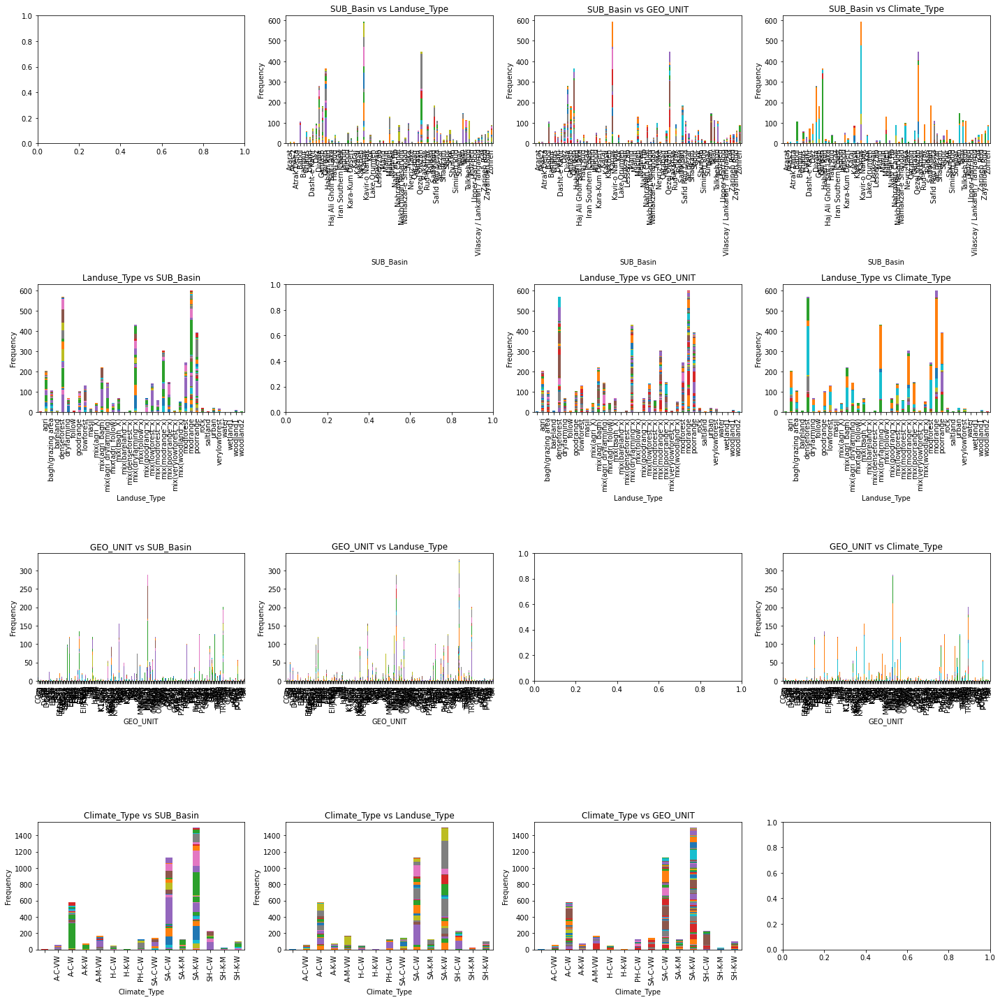

In [18]:
# Bivariate Analysis of Categorical Vs Categorical Variables
from scipy.stats import chi2_contingency

# Select categorical variables for analysis
categorical_vars = ["SUB_Basin", "Landuse_Type", "GEO_UNIT", "Climate_Type"]

# Create subplots for each pair of categorical variables
fig, axes = plt.subplots(len(categorical_vars), len(categorical_vars), figsize=(20, 20))

# Iterate over each pair of variables
for i, var1 in enumerate(categorical_vars):
    for j, var2 in enumerate(categorical_vars):
        if var1 != var2:
            # Create a crosstab of the two variables
            crosstab = pd.crosstab(df[var1], df[var2])
            # Plot the stacked bar chart
            crosstab.plot(kind='bar', stacked=True, ax=axes[i, j], legend=False)
            axes[i, j].set_title(f'{var1} vs {var2}')
            axes[i, j].set_xlabel(var1)
            axes[i, j].set_ylabel('Frequency')

# Perform chi-square test for selected pairs of categorical variables
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            crosstab = pd.crosstab(df[var1], df[var2])
            chi2, p, _, _ = chi2_contingency(crosstab)
            print(f'Chi-square test for {var1} vs. {var2}:')
            print(f'Chi-square statistic = {chi2}, p-value = {p}\n')

plt.tight_layout()
plt.show()

Chi-square test for SUB_Basin vs. Landuse_Type:
Chi-square statistic = 18773.502195250447, p-value = 0.0

Chi-square test for SUB_Basin vs. GEO_UNIT:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for SUB_Basin vs. Climate_Type:
Chi-square statistic = 17386.394234331696, p-value = 0.0

Chi-square test for Landuse_Type vs. SUB_Basin:
Chi-square statistic = 18773.50219525045, p-value = 0.0

Chi-square test for Landuse_Type vs. GEO_UNIT:
Chi-square statistic = 28805.30074181036, p-value = 0.0

Chi-square test for Landuse_Type vs. Climate_Type:
Chi-square statistic = 5980.754369044867, p-value = 0.0

Chi-square test for GEO_UNIT vs. SUB_Basin:
Chi-square statistic = 87850.13234186333, p-value = 0.0

Chi-square test for GEO_UNIT vs. Landuse_Type:
Chi-square statistic = 28805.300741810355, p-value = 0.0

Chi-square test for GEO_UNIT vs. Climate_Type:
Chi-square statistic = 17107.27376152548, p-value = 0.0

Chi-square test for Climate_Type vs. SUB_Basin:
Chi-square s

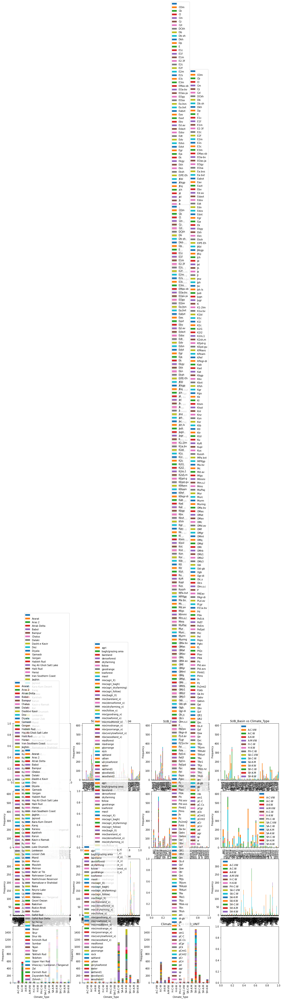

In [19]:
# Bivariate Analysis of Categorical Vs Categorical Variables
from scipy.stats import chi2_contingency

# Select categorical variables for analysis
categorical_vars = ["SUB_Basin", "Landuse_Type", "GEO_UNIT", "Climate_Type"]

# Calculate the number of rows needed
num_rows = len(categorical_vars)
num_cols = len(categorical_vars)

# Create subplots with three plots per row
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Flatten the axes if there is only one row
if num_rows == 1:
    axes = axes.reshape(1, -1)

# Iterate over each pair of variables
for i, var1 in enumerate(categorical_vars):
    for j, var2 in enumerate(categorical_vars):
        if var1 != var2:
            # Create a crosstab of the two variables
            crosstab = pd.crosstab(df[var1], df[var2])
            # Plot the stacked bar chart
            crosstab.plot(kind='bar', stacked=True, ax=axes[i, j], legend=False)
            axes[i, j].set_title(f'{var1} vs {var2}')
            axes[i, j].set_xlabel(var1)
            axes[i, j].set_ylabel('Frequency')
            axes[i, j].legend()

# Perform chi-square test for selected pairs of categorical variables
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            crosstab = pd.crosstab(df[var1], df[var2])
            chi2, p, _, _ = chi2_contingency(crosstab)
            print(f'Chi-square test for {var1} vs. {var2}:')
            print(f'Chi-square statistic = {chi2}, p-value = {p}\n')

plt.tight_layout()
plt.show()

Above is a chi-square test for each pair of categorical variables to determine if there is a significant association between them. And a grid of subplots, each showing a stacked bar chart for a pair of categorical variables.

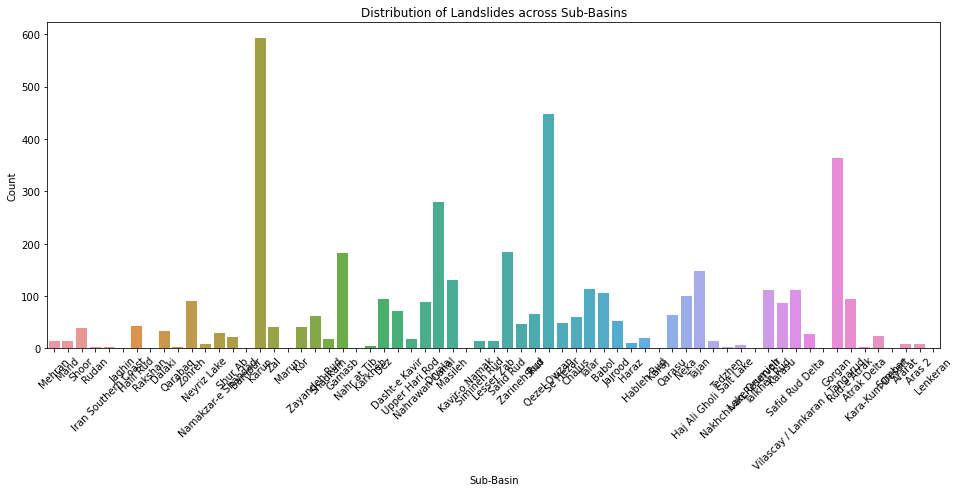

In [20]:
# Distribution of landslides across different sub-basins
plt.figure(figsize=(16, 6))
sns.countplot(x='SUB_Basin', data=df)
plt.title('Distribution of Landslides across Sub-Basins')
plt.xlabel('Sub-Basin')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# 3. Multivariate Analysis

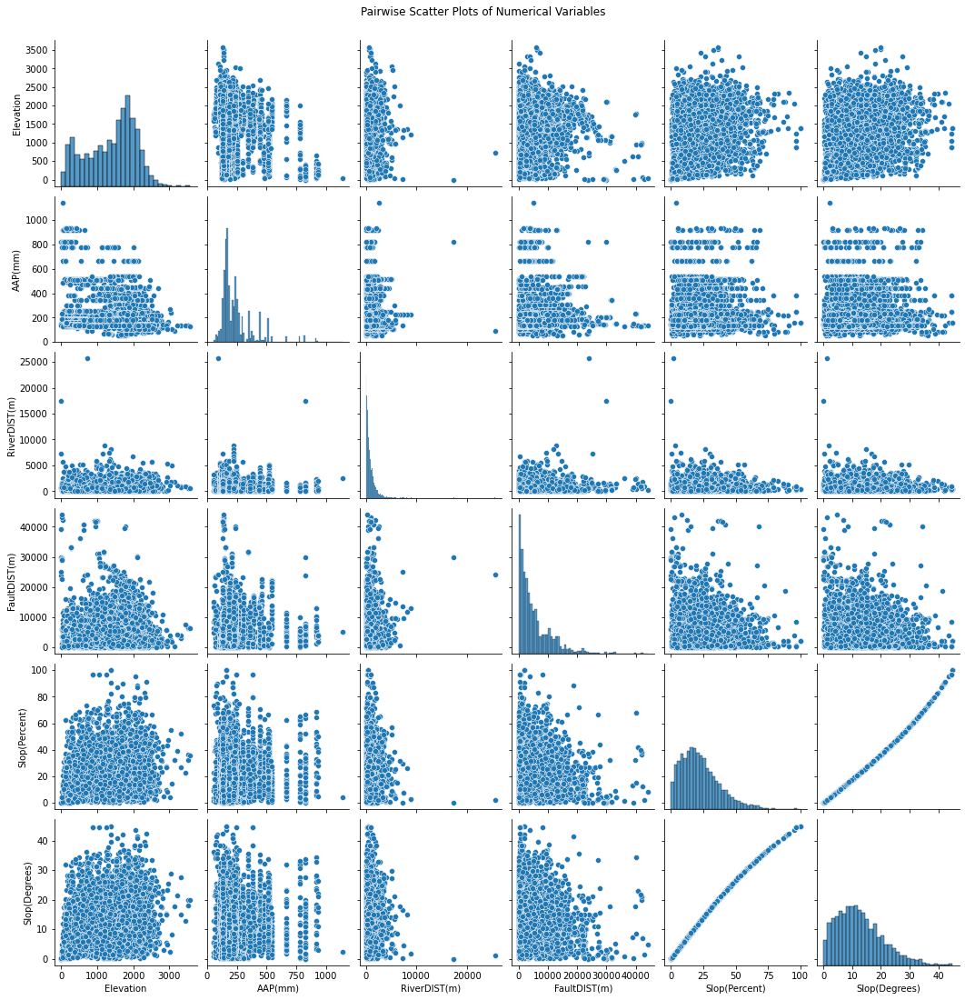

In [21]:
# Multivariate Analysis using Pairwise Scatter Plots of Numerical Variables
# Select subset of numerical variables for analysis
numerical_vars_subset = ["Elevation", "AAP(mm)", "RiverDIST(m)", "FaultDIST(m)", "Slop(Percent)", "Slop(Degrees)"]

# Create pairplot for subset of numerical variables
sns.pairplot(df[numerical_vars_subset])
plt.suptitle('Pairwise Scatter Plots of Numerical Variables', y=1.02)
plt.show()

Above is a grid of pairwise scatter plots for a subset of numerical variables, each plot showing the relationship between a pair of numerical variables from the subset. 

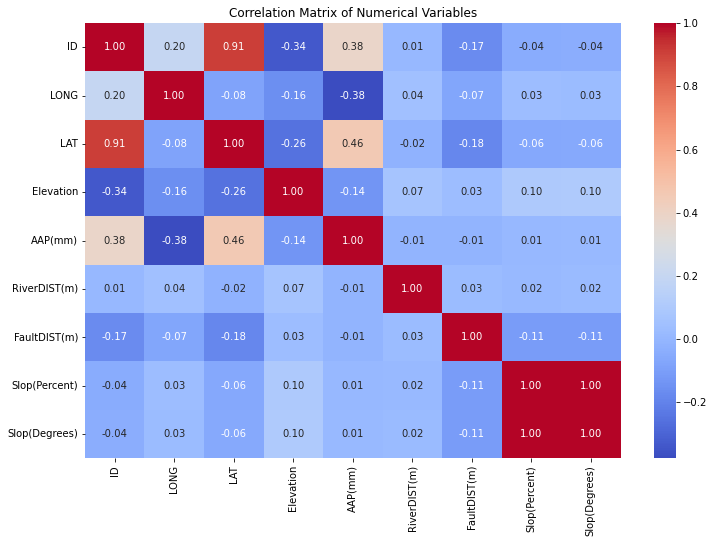

In [22]:
# Multivariate Analysis using a heatmap of the correlation matrix for all numerical variables

# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

A heatmap of the correlation matrix for all numerical variables to identify strong correlations between variables. Here each cell represents the correlation coefficient between two numerical variables. Note, the color intensity and annotation within each cell indicate the strength and direction of the correlation.

Multivariate Regression: Perform a multivariate regression analysis to understand the combined effect of multiple variables on a target variable (if available).

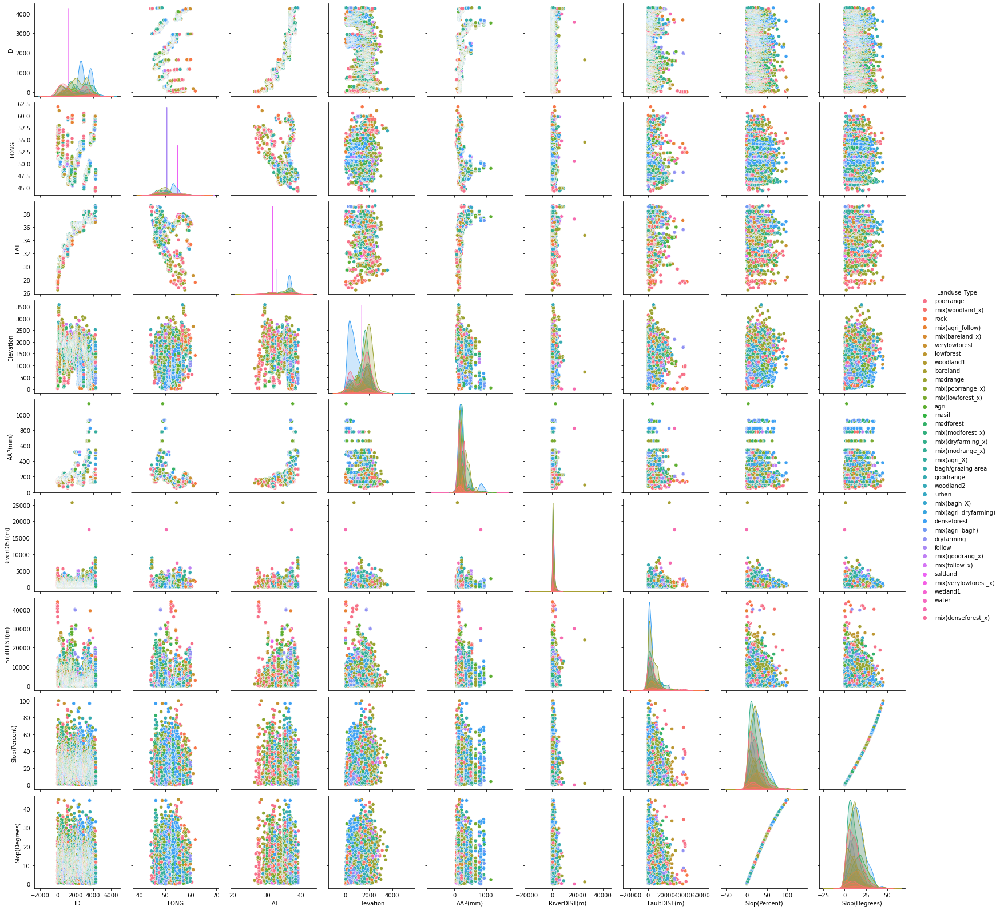

In [23]:
# Data visualization
sns.pairplot(df, hue='Landuse_Type')
plt.show()

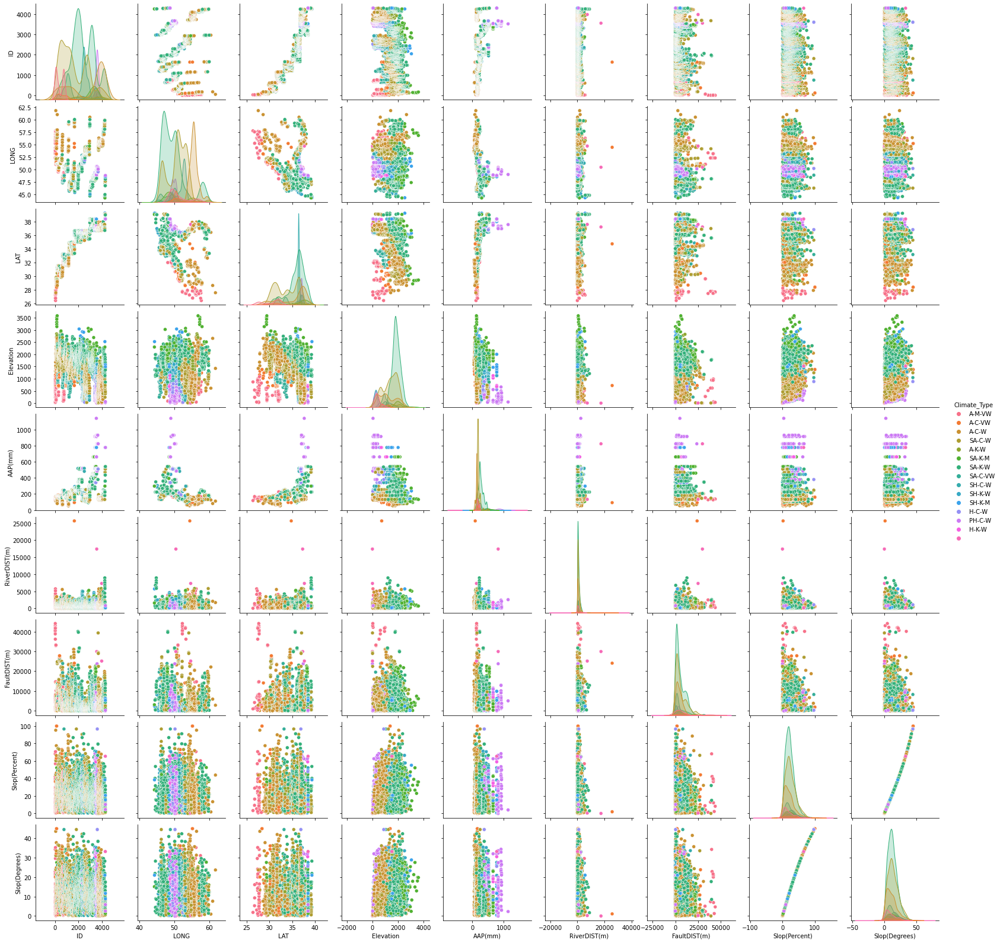

In [24]:
# Data visualization
sns.pairplot(df, hue='Climate_Type')
plt.show()

## Milestone Three: Interpretations
This section is dedicated to analyzing and interpreting the findings of the data analysis. It involves identifying key research questions and providing detailed explanations based on exploratory analysis. This process utilizes a combination of descriptive statistics, visualizations, and domain knowledge to interpret the data and generate insights. The ultimate goal is to provide a comprehensive understanding of the data and its implications, aiding in answering the research questions and drawing meaningful conclusions.

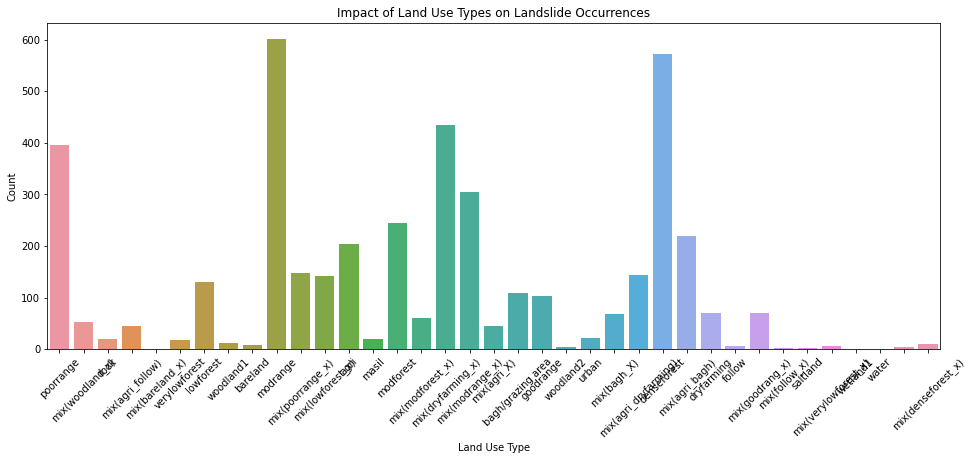

In [25]:
# Impact of land use types on landslide occurrences
plt.figure(figsize=(16, 6))
sns.countplot(x='Landuse_Type', data=df)
plt.title('Impact of Land Use Types on Landslide Occurrences')
plt.xlabel('Land Use Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

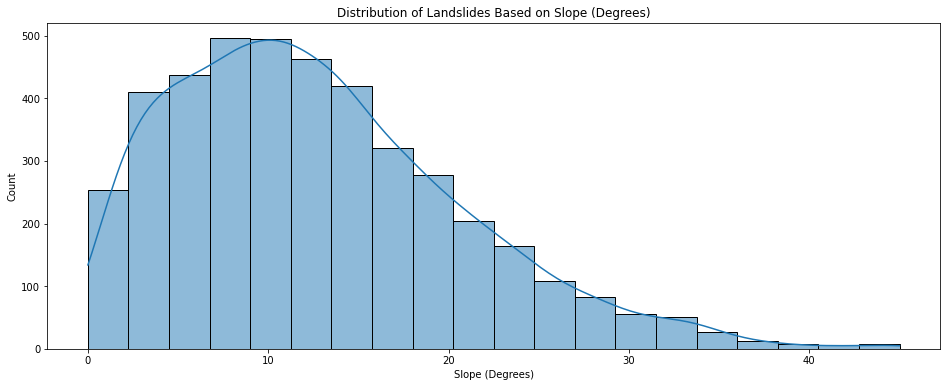

In [26]:
# Impact of Slope on Landslide Occurrences
plt.figure(figsize=(16, 6))
sns.histplot(df['Slop(Degrees)'], bins=20, kde=True)
plt.title('Distribution of Landslides Based on Slope (Degrees)')
plt.xlabel('Slope (Degrees)')
plt.ylabel('Count')
plt.show()

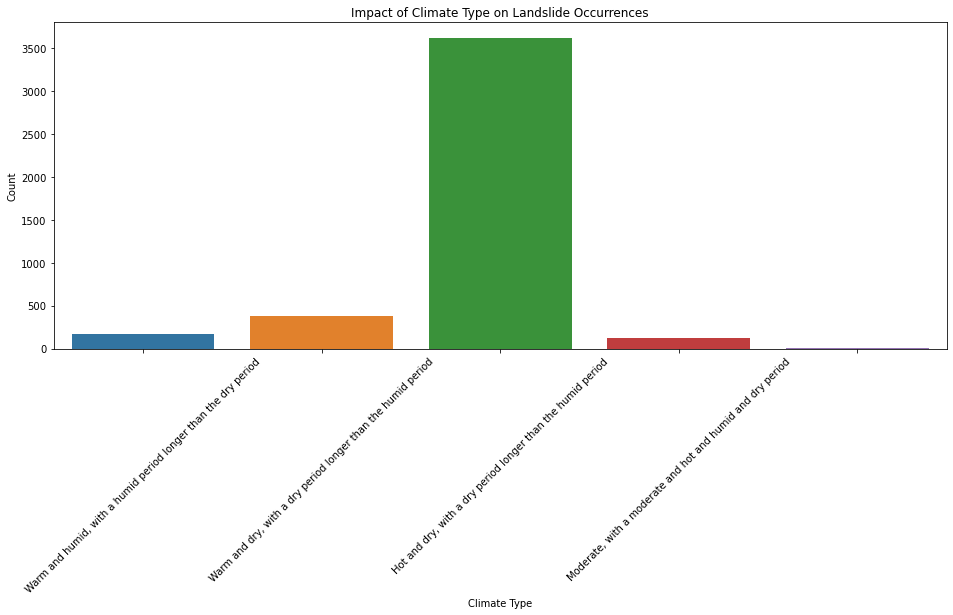

In [27]:
# Effect of Climate Type on Landslide Occurrences
plt.figure(figsize=(16, 6))
sns.countplot(x='DES_ClimateType', data=df)
plt.title('Impact of Climate Type on Landslide Occurrences')
plt.xlabel('Climate Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

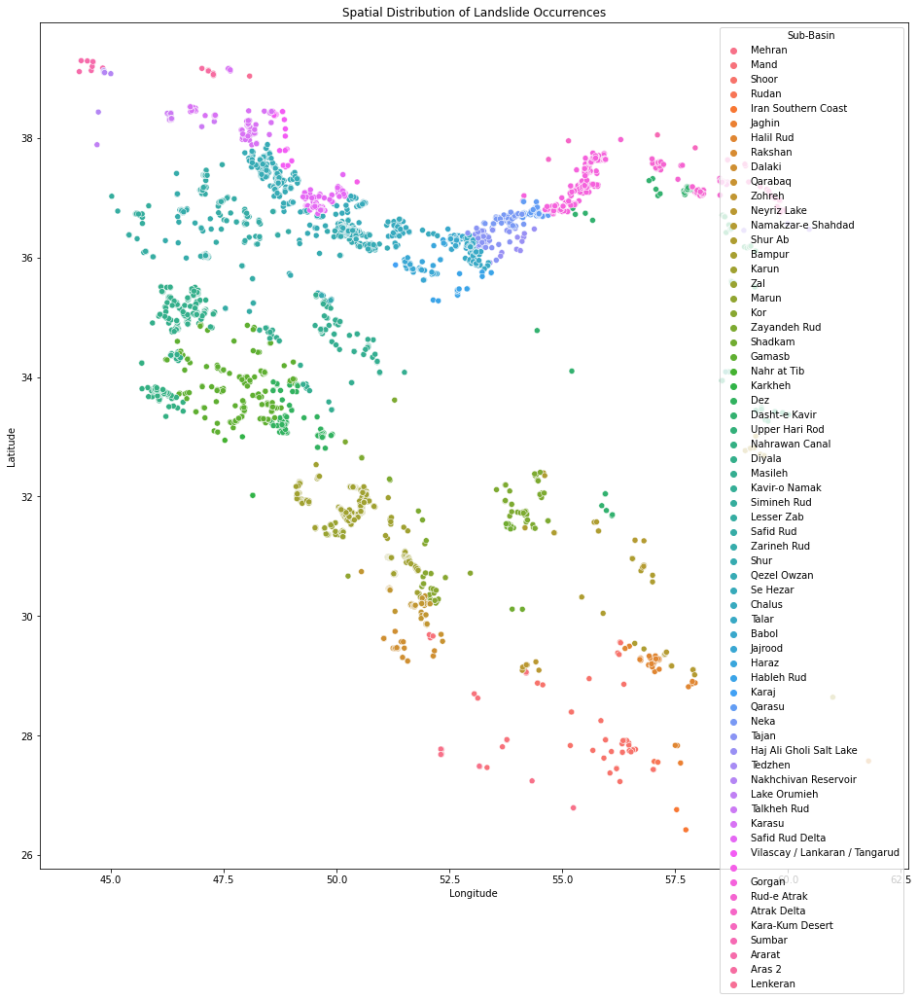

In [28]:
# Spatial Analysis of Landslide Occurrences
plt.figure(figsize=(16, 16))
sns.scatterplot(x='LONG', y='LAT', hue='SUB_Basin', data=df)
plt.title('Spatial Distribution of Landslide Occurrences')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Sub-Basin', loc='upper right')
plt.show()

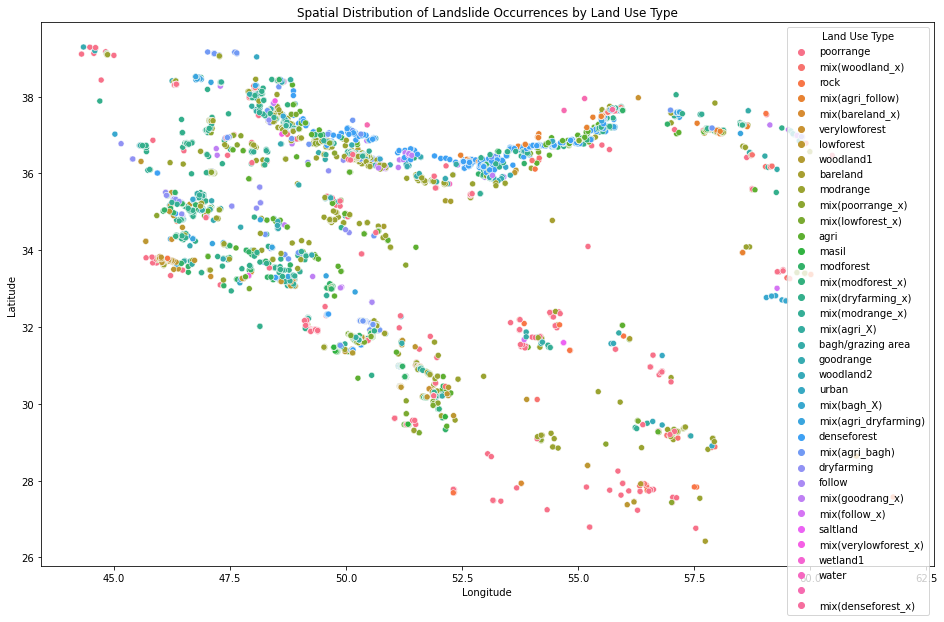

In [29]:
# Spatial Distribution of Landslide Occurrences by Land Use Type
plt.figure(figsize=(16, 10))
sns.scatterplot(x='LONG', y='LAT', hue='Landuse_Type', data=df)
plt.title('Spatial Distribution of Landslide Occurrences by Land Use Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Land Use Type', loc='upper right')
plt.show()

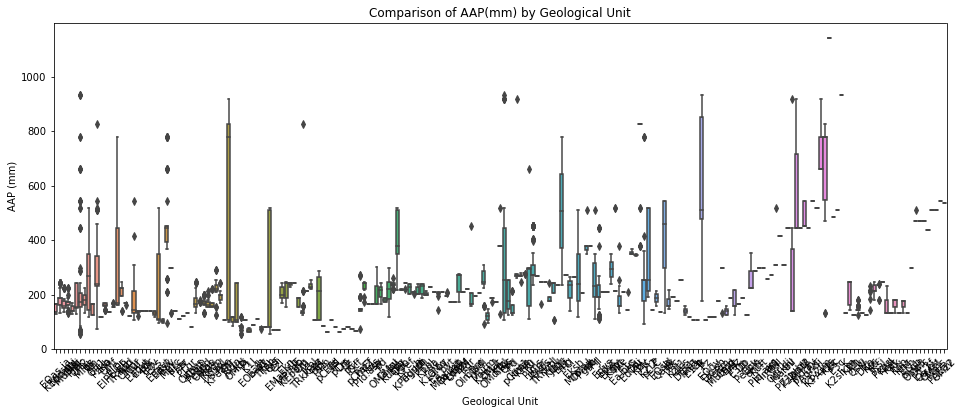

In [30]:
# Analysis of Landslide Characteristics by Geological Unit
plt.figure(figsize=(16, 6))
sns.boxplot(x='GEO_UNIT', y='AAP(mm)', data=df)
plt.title('Comparison of AAP(mm) by Geological Unit')
plt.xlabel('Geological Unit')
plt.ylabel('AAP (mm)')
plt.xticks(rotation=45)
plt.show()

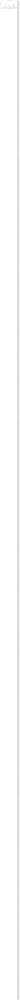

In [31]:
# Comparison of Landslide Characteristics by Land Use and Slope
plt.figure(figsize=(16, 6))
sns.boxplot(x='Landuse_Type', y='AAP(mm)', hue='Slop(Percent)', data=df)
plt.title('Comparison of AAP by Land Use and Slope')
plt.xlabel('Land Use Type')
plt.ylabel('AAP (mm)')
plt.xticks(rotation=45)
plt.legend(title='Slope (%)', loc='upper right')
plt.show()

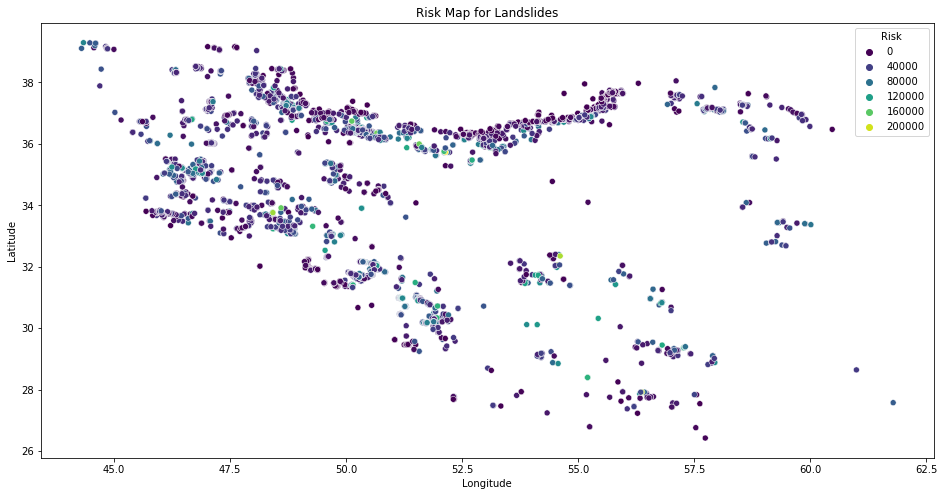

In [32]:
# Risk Mapping by combining Elevation and Slope for risk assessment
df['Risk'] = df['Elevation'] * df['Slop(Percent)']

plt.figure(figsize=(16, 8))
sns.scatterplot(x='LONG', y='LAT', hue='Risk', palette='viridis', data=df)
plt.title('Risk Map for Landslides')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

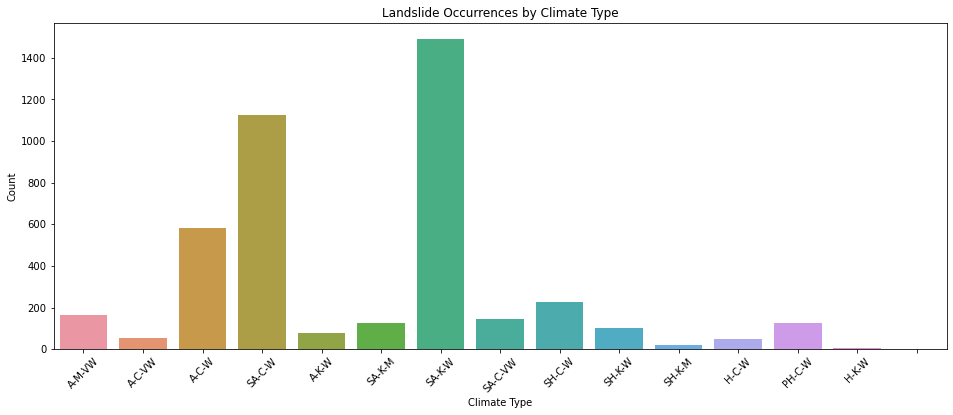

In [33]:
# Comparison of Landslide Occurrences in Different Climate Types
plt.figure(figsize=(16, 6))
sns.countplot(x='Climate_Type', data=df)
plt.title('Landslide Occurrences by Climate Type')
plt.xlabel('Climate Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

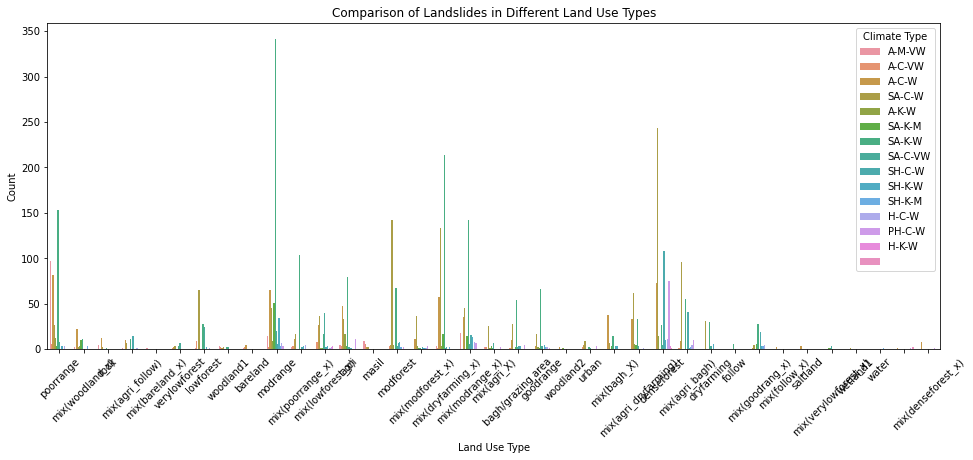

In [34]:
# Comparison of Landslides in Different Land Use Types
plt.figure(figsize=(16, 6))
sns.countplot(x='Landuse_Type', data=df, hue='Climate_Type')
plt.title('Comparison of Landslides in Different Land Use Types')
plt.xlabel('Land Use Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Climate Type', loc='upper right')
plt.show()

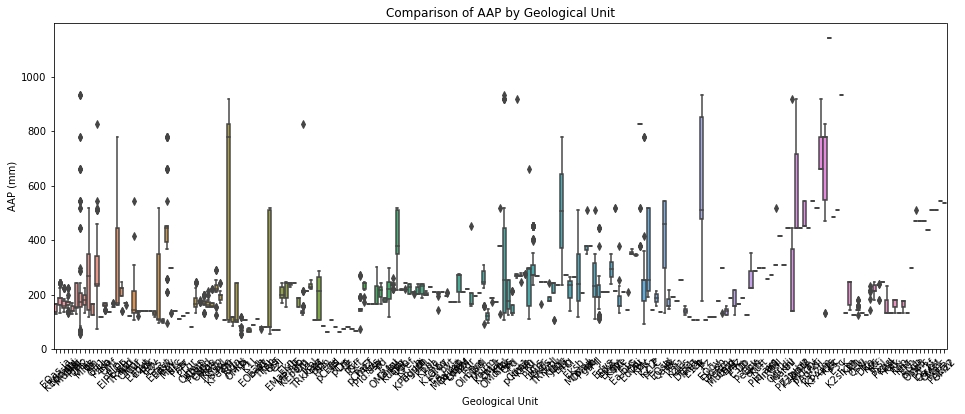

In [35]:
# Analysis of Landslide Characteristics by Geological Unit
plt.figure(figsize=(16, 6))
sns.boxplot(x='GEO_UNIT', y='AAP(mm)', data=df)
plt.title('Comparison of AAP by Geological Unit')
plt.xlabel('Geological Unit')
plt.ylabel('AAP (mm)')
plt.xticks(rotation=45)
plt.show()

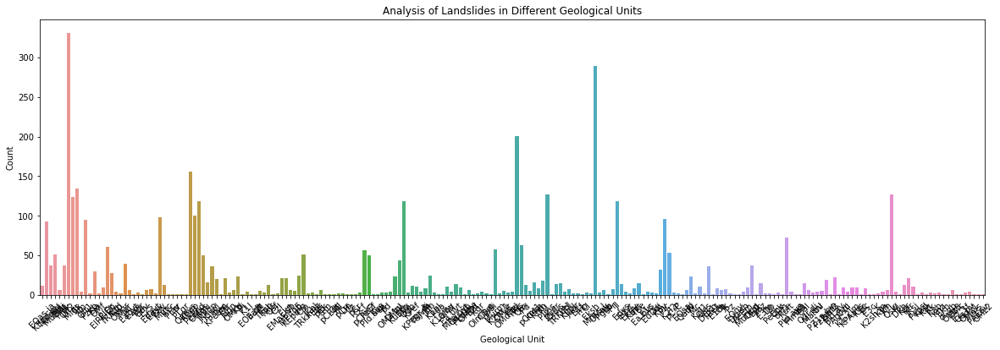

In [36]:
# Analysis of Landslides in Different Geological Units
plt.figure(figsize=(20, 6))
sns.countplot(x='GEO_UNIT', data=df)
plt.title('Analysis of Landslides in Different Geological Units')
plt.xlabel('Geological Unit')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

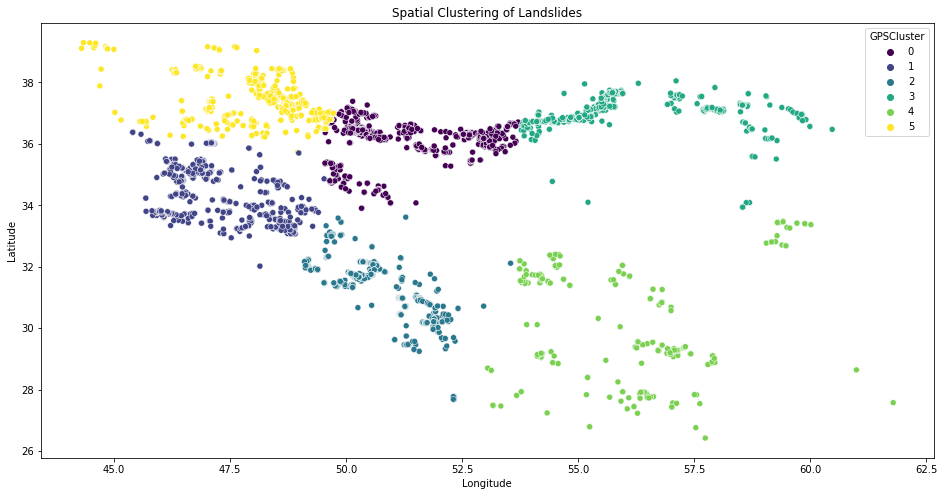

In [37]:
# Spatial Clustering Analysis using Longitude and Latitude
from sklearn.cluster import KMeans

# Cluster the landslides into 6 clusters
kmeans = KMeans(n_clusters=6, random_state=42).fit(df[['LONG', 'LAT']])
df['GPSCluster'] = kmeans.labels_

plt.figure(figsize=(16, 8))
sns.scatterplot(x='LONG', y='LAT', hue='GPSCluster', palette='viridis', data=df)
plt.title('Spatial Clustering of Landslides')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

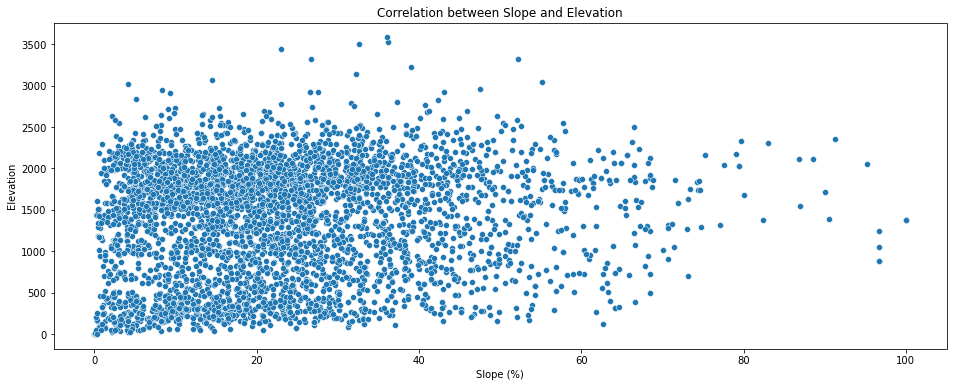

In [38]:
# Correlation Analysis between Slope and Elevation
plt.figure(figsize=(16, 6))
sns.scatterplot(x='Slop(Percent)', y='Elevation', data=df)
plt.title('Correlation between Slope and Elevation')
plt.xlabel('Slope (%)')
plt.ylabel('Elevation')
plt.show()

## Milestone Four: Machine Learning Models

From the dataset provided, it is apparent that the target variable is explicitly missing. However, based on common understanding in landslide datasets, the dataset includes historical or observational data about landslides, the target variable would typically be a binary column indicating whether a landslide occurred at a specific location or not (e.g., 1 for landslide occurrence, 0 for no landslide).

Given the columns in the provided dataset, none directly indicates the occurrence of a landslide. Therefore, it's possible that the dataset might be missing a target variable explicitly indicating landslide occurrences. Without this critical variable, the dataset may not be suitable for modeling landslide occurrences. The absence of a target variable directly indicating landslide occurrences suggests that additional information or data may be necessary to effectively model landslides using this dataset.

### Applying KMeans Clustering

In [39]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Data Preparation for Clustering and Dimensionality Reduction
X = df.drop(['ID', 'LAT', 'LONG', 'SUB_Basin', 'Landuse_Type', 'GEO_UNIT', 'DES_GEOUNI', 'Climate_Type', 'DES_ClimateType'], axis=1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Clustering with KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)
df['cluster'] = kmeans.labels_

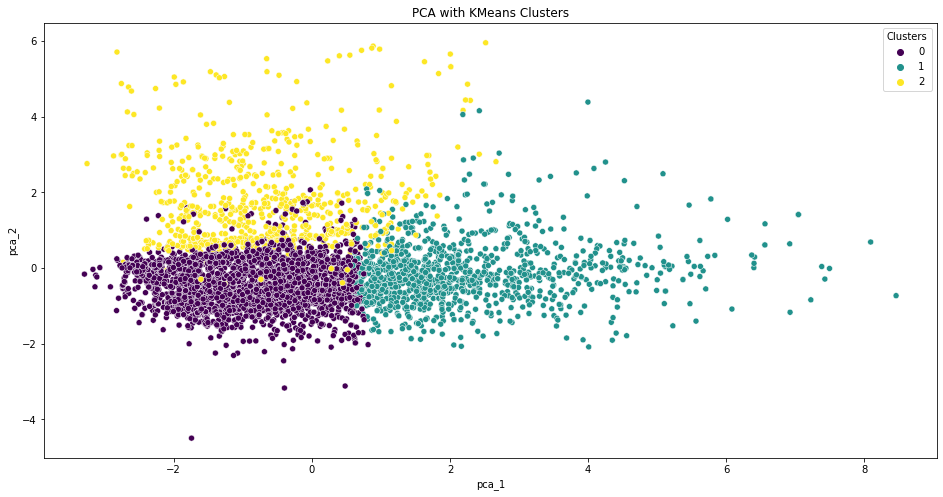

In [40]:
from sklearn.decomposition import PCA

# Dimensionality Reduction with PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df['pca_1'] = principal_components[:, 0]
df['pca_2'] = principal_components[:, 1]

# Visualizing Clusters
plt.figure(figsize=(16, 8))

sns.scatterplot(data=df, x='pca_1', y='pca_2', hue='cluster', palette='viridis')
plt.title('PCA with KMeans Clusters')
plt.legend(title='Clusters', loc='upper right')
plt.show()

In [41]:
# Feature Engineering
df['SumDIST(m)'] = df['RiverDIST(m)'] + df['FaultDIST(m)']

# Displaying the updated dataframe
df.head()

,ID,LONG,LAT,SUB_Basin,Elevation,AAP(mm),RiverDIST(m),FaultDIST(m),Landuse_Type,Slop(Percent),...,GEO_UNIT,DES_GEOUNI,Climate_Type,DES_ClimateType,Risk,GPSCluster,cluster,pca_1,pca_2,SumDIST(m)
0,1,52.326,27.763,Mehran,617.0,137,1448.705292,40639.57890,poorrange,42.240669,...,EOas-ja,"Undivided Asmari and Jahrum Formation , regard...",A-M-VW,"Warm and humid, with a humid period longer tha...",26062.492958,2,1,0.571531,-0.040809,42088.284192
1,2,52.333,27.772,Mehran,944.0,137,344.299484,40135.02913,mix(woodland_x),68.219116,...,KEpd-gu,Keewatin Epedotic quartz diorite,A-M-VW,"Warm and humid, with a humid period longer tha...",64398.845693,2,1,3.116667,0.374101,40479.328614
2,3,52.326,27.763,Mehran,617.0,137,1448.705292,40639.57890,poorrange,42.240669,...,EOas-ja,"Undivided Asmari and Jahrum Formation , regard...",A-M-VW,"Warm and humid, with a humid period longer tha...",26062.492958,2,1,0.571531,-0.040809,42088.284192
3,4,52.333,27.694,Mehran,55.0,137,1889.828623,42189.54442,rock,12.141766,...,Mlmmi,Low weathering grey marls alternating with ba...,A-M-VW,"Warm and humid, with a humid period longer tha...",667.797108,2,0,-2.315889,-0.423893,44079.373043
4,5,52.324,27.682,Mehran,20.0,137,874.201691,43010.08400,poorrange,2.216230,...,MuPlaj,"Brown to grey , calcareous , feature - formin...",A-M-VW,"Warm and humid, with a humid period longer tha...",44.324598,2,0,-3.140705,-0.496307,43884.285691


## Milestone Five: Dashboard and Presentation

Here we use Streamlit library to create an interactive dashboard showcasing key findings, visualizations, and model predictions.

In [42]:
import streamlit as st
import types
import hashlib
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def my_hash_func(func):
    # Generate a unique hash for the function
    hash_object = hashlib.md5(func.__code__.co_code)
    return hash_object.hexdigest()

# Load the dataset
@st.cache_resource(hash_funcs={types.FunctionType: my_hash_func})
def load_data():
    # Your data loading code here
    df = pd.read_csv('Landslide_Factors_IRAN.csv')
    return df

df = load_data()

# Sidebar with options
st.sidebar.title('Dashboard Options')
selected_option = st.sidebar.selectbox('Select Option', ['Exploratory Data Analysis', 'Clustering', 'Dimensionality Reduction'])

# Main content based on selected option
if selected_option == 'Exploratory Data Analysis':
    st.title('Exploratory Data Analysis')
    st.write(df.head())
    st.write('Summary Statistics:')
    st.write(df.describe())

elif selected_option == 'Clustering':
    st.title('Clustering Analysis')
    st.write('Performing KMeans Clustering...')
    X_clustering = df[['Elevation', 'AAP(mm)', 'RiverDIST(m)', 'FaultDIST(m)', 'Slop(Percent)', 'Slop(Degrees)']]
    scaler = StandardScaler()
    X_scaled_clustering = scaler.fit_transform(X_clustering)
    kmeans = KMeans(n_clusters=3, random_state=42)
    df['cluster'] = kmeans.fit_predict(X_scaled_clustering)
    st.write('Cluster Assignment:')
    st.write(df[['ID', 'cluster']])

elif selected_option == 'Dimensionality Reduction':
    st.title('Dimensionality Reduction')
    st.write('Performing PCA...')
    X_pca = df[['Elevation', 'AAP(mm)', 'RiverDIST(m)', 'FaultDIST(m)', 'Slop(Percent)', 'Slop(Degrees)']]
    scaler_pca = StandardScaler()
    X_scaled_pca = scaler_pca.fit_transform(X_pca)
    pca = PCA(n_components=2)
    df['pca_1'], df['pca_2'] = pca.fit_transform(X_scaled_pca).T
    st.write('PCA Results:')
    st.write(df[['ID', 'pca_1', 'pca_2']])

# Key Findings
st.title('Key Findings')



# Visualizations
st.title('Visualizations')



# Model Predictions
st.title('Model Predictions')




2024-04-29 21:46:08.627 
  command:

    streamlit run C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


DeltaGenerator()